# What is Neural Style Transfer?

NST is an optimization technique used to take three images and blend them together:

* Content Image : The image containing the main structure.
* Style Image : The image containing the artistic texture, brush strokes, and colors.
* Generated Image: The final output. We usually initialize this as random noise or a copy of the Content Image.


![](https://miro.medium.com/v2/resize:fit:1400/1*VhvzxTyAcK8f7pEs5TsHJA.png)

## How does it work?



#### 1. We take content and style images as input and pre-process them.
#### 2. Next, we load VGG19 which is a pre-trained CNN (convolutional neural network).  

   Starting from the network's input layer, the first few layer activations represent low-level features like colors, and textures. As we step through the network, the final few layers represent higher level features like eyes.  
In this case, we use  conv1_1, conv2_1, conv3_1, conv4_1, conv5_1 for style representation, and conv4_2 for content representation.

#### 3. We begin by cloning the content image and then iteratively changing its style. Then, we set our task as an optimization problem where we try to minimize:

* content loss, which is the L2 distance between the content and the generated image,
* style loss, which is the sum of L2 distances between the Gram matrices of the representations of the content image and the style image, extracted from different layers of VGG19.
* total variation loss, which is used for spatial continuity between the pixels of the generated image, thereby denoising it and giving it visual coherence.


# Libraries needed

In [39]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from keras.applications import vgg19
from keras.preprocessing.image import load_img, save_img, img_to_array
import tensorflow as tf
from tensorflow.keras.applications import VGG19
from tensorflow.keras import Model
import time
from scipy.optimize import fmin_l_bfgs_b


# Preprocessing

In [40]:
StylePath = '../input/best-artworks-of-all-time/images/images/'
ContentPath = '../input/image-classification/validation/validation/travel and adventure/'
content_image_path='/kaggle/input/image-classification/validation/validation/travel and adventure/9.jpeg'
style_image_path='/kaggle/input/best-artworks-of-all-time/images/images/Alfred_Sisley/Alfred_Sisley_101.jpg'

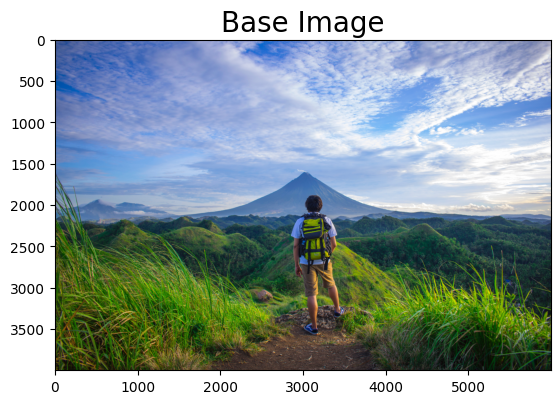

In [41]:
plt.figure()
plt.title("Base Image",fontsize=20)
img1 = load_img(content_image_path)
plt.imshow(img1)

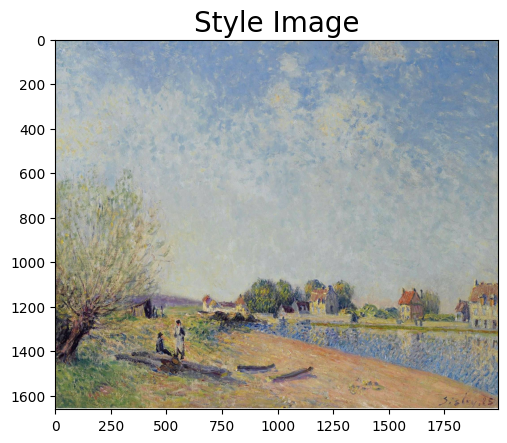

In [42]:
plt.figure()
plt.title("Style Image",fontsize=20)
img2 = load_img(style_image_path)
plt.imshow(img2)

In [43]:
def preprocess_image(image_path):
    img = load_img(image_path, target_size=(img_nrows, img_ncols))
    img = img_to_array(img)
    img = np.expand_dims(img, axis=0) # add a d to tranformer it into btaches so the batch contain 1 image
    img = vgg19.preprocess_input(img)
    return img


In [44]:
width, height = load_img(content_image_path).size
img_nrows = 400
img_ncols = int(width * img_nrows / height)
(width,height),(img_nrows,img_ncols)

((6000, 4000), (400, 600))

In [45]:
print("GPU available:", tf.config.list_physical_devices('GPU'))

GPU available: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


In [46]:
base_image = tf.convert_to_tensor(preprocess_image(content_image_path))
style_reference_image = tf.convert_to_tensor(preprocess_image(style_image_path))

# Feature Extractor

![](https://miro.medium.com/max/1400/1*6U9FJ_se7SIuFKJRyPMHuA.png)

In [47]:
def vgg19_feature_extractor():
    vgg= VGG19(include_top=False, weights='imagenet')
    # false beacuse we only need the feature extraction layer without classification head
    vgg.trainable=False

    content_layer=['block5_conv2'] # 2nd layer inside 5th block
    style_layer=[
        'block1_conv1',  # early layers capture simple textures
        'block2_conv1',  
        'block3_conv1',  
        'block4_conv1',  
        'block5_conv1'   # very complex patterns
    ]

    outputs_dict = {# loop through layers only choosen
        layer.name: layer.output 
        for layer in vgg.layers 
        if layer.name in content_layer + style_layer # grab the output tesnor and made a dict where it holds the actual math output
    }
    feature_extractor = Model(inputs=vgg.input, outputs=outputs_dict)
    return feature_extractor, content_layer, style_layer


In [48]:
model, content_layers, style_layers = vgg19_feature_extractor()
print("VGG19 feature extractor created!")
print(f"Content layers: {content_layers}")
print(f"Style layers: {style_layers}")

VGG19 feature extractor created!
Content layers: ['block5_conv2']
Style layers: ['block1_conv1', 'block2_conv1', 'block3_conv1', 'block4_conv1', 'block5_conv1']


In [49]:
generated_image = tf.Variable(base_image) # intatilize


In [50]:
content_targets = model(base_image) # get features from each image
style_targets = model(style_reference_image)
content_target = content_targets[content_layers[0]] #grab bolck5conv2
style_targets_dict = {layer: style_targets[layer] for layer in style_layers}

In [51]:
print(f"Content image shape: {base_image.shape}")
print(f"Style image shape: {style_reference_image.shape}") 
print(f"Generated image shape: {generated_image.shape}")
print(f"Model input shape: {model.input_shape}")


Content image shape: (1, 400, 600, 3)
Style image shape: (1, 400, 600, 3)
Generated image shape: (1, 400, 600, 3)
Model input shape: (None, None, None, 3)


# Loss functions

## Total loss

### [reference](https://wandb.ai/wandb_fc/articles/reports/Exploring-Neural-Style-Transfer-with-Weights-Biases--Vmlldzo1NDM1MjA2)

![](https://api.wandb.ai/files/wandb_fc/images/projects/38184289/fe8ba55b.png)

![](https://api.wandb.ai/files/wandb_fc/images/projects/38184289/d5ebdd42.png)


## Content Loss (Shape penalty)

let p and x be the original image and the image that is generated and P and F their respective feature representation in layer i . We then define the squared-error loss between the two feature representations as the content loss.


![](https://api.wandb.ai/files/wandb_fc/images/projects/38184289/ff03ef99.png)

## style Loss (texture penalty)
let a and x be the original image and the image that is generated and Ai and Gi their respective style representations in layer i  . The contribution of that layer to the total loss is then


![](https://api.wandb.ai/files/wandb_fc/images/projects/38184289/96800f71.png)

Here G represents a correlation between style features known as “gram matrix”.  
It is essentially a measure of style captured by the features.  
Wl represents the weight of a particular layer  


### Gram matrix

![](https://pluralsight2.imgix.net/guides/02a7081c-7425-4c20-ae26-b26d27ed897b_gra.jpg)

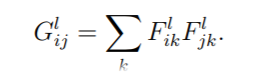
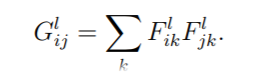

1. Take the entire "grid" of activations for Filter i (flattened into a vector).
2. Take the entire "grid" of activations for Filter j (flattened into a vector).
3. Calculate the Dot Product between them.(Mathematically, the dot product measures similarity.)

in simple words  
In the original painting, whenever I see 'Blue', I also see 'Curved Lines'. Does your image do that too?  
This relationship (Blue + Curves) is calculated using the Gram Matrix.

### Total Variation Loss
Variation loss was introduced to avoid highly noisy outputs and overly pixelated results. The main purpose of variation loss is to maintain smoothness and spatial continuity.

In [52]:
#https://www.pluralsight.com/resources/blog/guides/implementing-artistic-neural-style-transfer-with-tensorflow-20
def gram_matrix(input_tensor):
    result = tf.linalg.einsum('bijc,bijd->bcd', input_tensor, input_tensor)
    #normalize (to be fair regradless how big or small the image layer)
    input_shape = tf.shape(input_tensor)
    num_locations = tf.cast(input_shape[1] * input_shape[2], tf.float32)
    return result / num_locations

def compute_content_loss(base_content, target):
    return tf.reduce_mean(tf.square(base_content - target))

def compute_style_loss(base_style, gram_target):
    gram_style = gram_matrix(base_style)
    return tf.reduce_mean(tf.square(gram_style - gram_target))

def total_variation_loss(image):
    # gradients    
    x_deltas = image[:, :, 1:, :] - image[:, :, :-1, :]
    y_deltas = image[:, 1:, :, :] - image[:, :-1, :, :]
    return tf.reduce_mean(tf.abs(x_deltas)) + tf.reduce_mean(tf.abs(y_deltas))

In [53]:
gram_style_targets = { # A
    layer: gram_matrix(style_targets[layer]) 
    for layer in style_layers
}

In [54]:
content_weight = 1000.0
style_weight = 0.1
total_variation_weight = 30

optimizer = tf.optimizers.Adam(
    learning_rate=0.02, 
    beta_1=0.99, 
    epsilon=1e-1
)


# Deprocess 

In [55]:
def deprocess_image(x):
    x = x.numpy()[0] if hasattr(x, 'numpy') else (x[0] if x.ndim == 4 else x)
    x = x.astype('float32') + [123.68, 116.779, 103.939][::-1]  # Add means in RGB order average Pixel Values of the entire ImageNet dataset
    return np.clip(x[..., ::-1], 0, 255).astype('uint8')

In [56]:
def display_results(generated_img):
    images = [
        (deprocess_image(base_image), 'Content Image'),
        (deprocess_image(style_reference_image), 'Style Image'),
        (deprocess_image(generated_img), 'Generated Image')
    ]
    
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    for ax, (img, title) in zip(axes, images):
        ax.imshow(img)
        ax.set_title(title)
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

In [57]:
def plot_training_history(history):
    epochs = history['epochs']
    
    plt.figure(figsize=(15, 6))

    # Subplot 1: Total Loss
    plt.subplot(1, 2, 1)
    plt.plot(epochs, history['total_loss'], label='Total Loss', color='black', linewidth=2)
    plt.title('Total Loss Evolution')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.grid(True, alpha=0.3)
    plt.legend()

    # Subplot 2: Individual Components (often on Log Scale due to magnitude differences)
    plt.subplot(1, 2, 2)
    plt.plot(epochs, history['style_loss'], label='Style Loss', color='tab:blue')
    plt.plot(epochs, history['content_loss'], label='Content Loss', color='tab:orange')
    plt.plot(epochs, history['tv_loss'], label='TV Loss', color='tab:green')
    
    plt.title('Loss Components Breakdown')
    plt.xlabel('Epochs')
    plt.ylabel('Loss (Log Scale)')
    plt.yscale('log') # Log scale is recommended as Style Loss is usually much larger
    plt.grid(True, alpha=0.3, which='both')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Training

In [58]:
@tf.function
def train_step(generated_image):
    with tf.GradientTape() as tape:
        # Extract features from current generated image
        generated_features = model(generated_image)
        
        # Content loss
        generated_content = generated_features[content_layers[0]]
        content_loss = content_weight * compute_content_loss(
            generated_content, content_target
        )
        
        # Style loss
        style_loss = 0
        for layer in style_layers:
            generated_style = generated_features[layer]
            style_loss += compute_style_loss(
                generated_style, gram_style_targets[layer]
            )
        style_loss *= style_weight
        
        # Total variation loss
        tv_loss = total_variation_weight * total_variation_loss(generated_image)
        
        # Total loss
        total_loss = content_loss + style_loss + tv_loss
    
    # Compute gradients and update generated image
    gradients = tape.gradient(total_loss, generated_image)
    optimizer.apply_gradients([(gradients, generated_image)])
    
    # Clip pixel values to valid range
    generated_image.assign(tf.clip_by_value(generated_image, 0.0, 255.0))
    
    return total_loss, content_loss, style_loss, tv_loss

In [59]:
epochs = 1500
print_interval = 100


history = {
    'epochs': [],
    'total_loss': [],
    'content_loss': [],
    'style_loss': [],
    'tv_loss': []
}

print("Starting training...")
start_time = time.time()

for epoch in range(epochs + 1):
    total_loss, content_loss, style_loss, tv_loss = train_step(generated_image)
    
    if epoch % print_interval == 0:
        end_time = time.time()
        
        history['epochs'].append(epoch)
        history['total_loss'].append(float(total_loss))
        history['content_loss'].append(float(content_loss))
        history['style_loss'].append(float(style_loss))
        history['tv_loss'].append(float(tv_loss))
        print(f"Content loss: {content_loss.numpy():.2f}") 

        print(f"Style loss: {style_loss.numpy():.2f}")

        print(f"TV loss: {tv_loss.numpy():.2f}")
        print(f"Epoch {epoch} | Total loss: {total_loss:.2f}")

Starting training...
Content loss: 0.00
Style loss: 3683106816.00
TV loss: 736.70
Epoch 0 | Total loss: 3683107584.00
Content loss: 1150836.88
Style loss: 2831025152.00
TV loss: 257.87
Epoch 100 | Total loss: 2832176128.00
Content loss: 1234470.62
Style loss: 2031687680.00
TV loss: 286.81
Epoch 200 | Total loss: 2032922368.00
Content loss: 1312113.62
Style loss: 1428003072.00
TV loss: 316.89
Epoch 300 | Total loss: 1429315456.00
Content loss: 1391724.38
Style loss: 991174080.00
TV loss: 347.55
Epoch 400 | Total loss: 992566144.00
Content loss: 1443689.75
Style loss: 690502592.00
TV loss: 376.92
Epoch 500 | Total loss: 691946688.00
Content loss: 1478249.00
Style loss: 492909056.00
TV loss: 403.10
Epoch 600 | Total loss: 494387712.00
Content loss: 1504715.12
Style loss: 362806976.00
TV loss: 425.17
Epoch 700 | Total loss: 364312096.00
Content loss: 1524800.12
Style loss: 276496768.00
TV loss: 443.30
Epoch 800 | Total loss: 278022016.00
Content loss: 1541489.12
Style loss: 218529872.00
TV

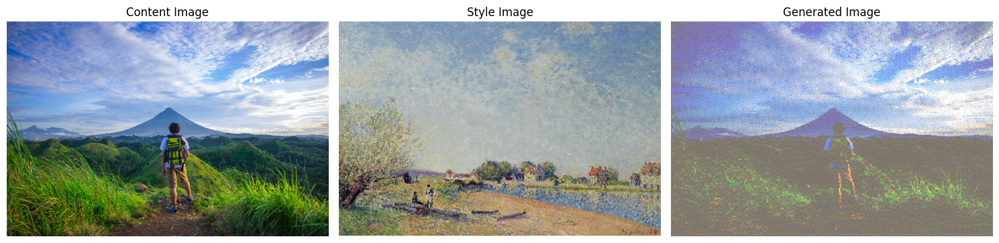

In [60]:
display_results(generated_image)


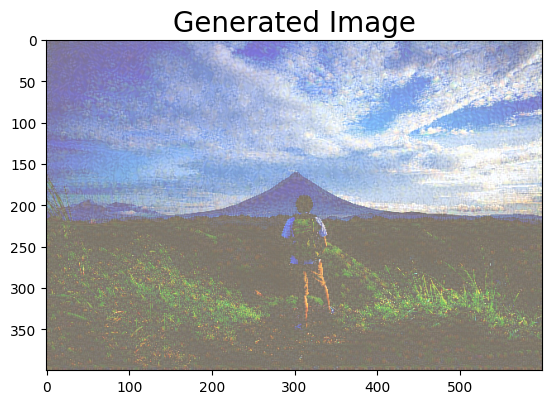

In [61]:
plt.figure()
plt.title("Generated Image",fontsize=20)
plt.imshow(deprocess_image(generated_image))

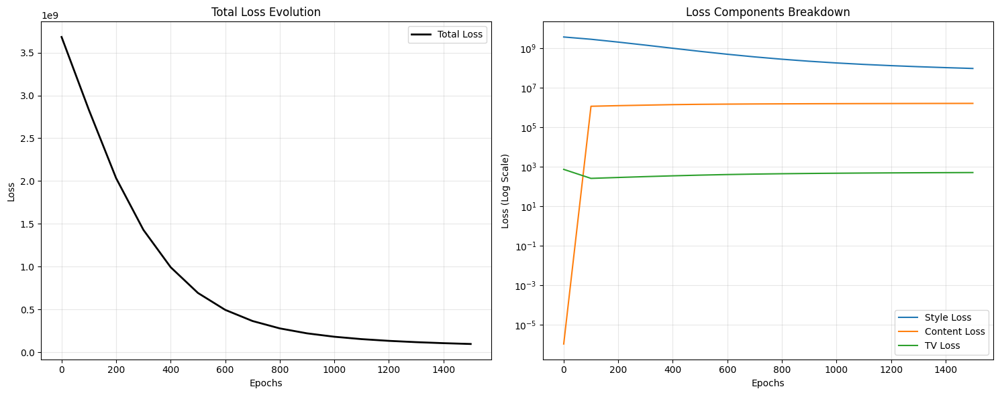

In [62]:
plot_training_history(history)

___

# Testing with other optimizer ( LBFGSB )

### [reference](https://lbfgsb.readthedocs.io/en/latest/)

L-BFGS-B is generally faster and produces sharper images because it uses smarter mathematics (it estimates curvature, not just slope).

In [64]:
style_weight = 1.0  
content_weight = 0.5  
total_variation_weight = 30



In [65]:
def compute_loss_and_grads(x):
    x = x.reshape((1, img_nrows, img_ncols, 3)) 
    generated_image = tf.convert_to_tensor(x, dtype=tf.float32)
    with tf.GradientTape() as tape:
        tape.watch(generated_image)
        
        generated_features = model(generated_image)
        
        # Content loss
        generated_content = generated_features[content_layers[0]]
        content_loss = content_weight * compute_content_loss(
            generated_content, content_target
        )
        
        # Style loss
        style_loss = 0
        for layer in style_layers:
            generated_style = generated_features[layer]
            style_loss += compute_style_loss(
                generated_style, gram_style_targets[layer]
            )
        style_loss *= style_weight
        
        # Total variation loss
        tv_loss = total_variation_weight * total_variation_loss(generated_image)
        
        # Total loss
        total_loss = content_loss + style_loss + tv_loss
    
    grads = tape.gradient(total_loss, generated_image)
    #reporting
    return total_loss.numpy().astype('float64'), grads.numpy().flatten().astype('float64')

In [66]:
x = preprocess_image(content_image_path).flatten().astype('float64')

In the Adam version, we calculated loss and immediately updated the pixels. In this version, we calculate but do not update.

In [68]:
iteration = [0]
loss_history = []
def callback(x):
    loss, _ = compute_loss_and_grads(x) # only for testing , because it doubles the runtime
    current_loss = float(loss) 
    loss_history.append(current_loss)
    print(f'Iteration {iteration[0]}, Loss: {loss:.2e}')
    iteration[0] += 1

print('Starting optimization with L-BFGS-B')
start_time = time.time()

x_opt, loss_value, info = fmin_l_bfgs_b(
    compute_loss_and_grads, 
    x, 
    maxiter=50,#try to improve the image x times.
    maxfun=70,#don't call the loss function more than x+n times.
    disp=True,
    callback=callback
)

Starting optimization with L-BFGS-B
Iteration 0, Loss: 2.90e+10
Iteration 1, Loss: 1.59e+10
Iteration 2, Loss: 1.12e+10
Iteration 3, Loss: 5.92e+09
Iteration 4, Loss: 3.58e+09
Iteration 5, Loss: 2.84e+09
Iteration 6, Loss: 2.06e+09
Iteration 7, Loss: 1.86e+09
Iteration 8, Loss: 1.51e+09
Iteration 9, Loss: 1.15e+09
Iteration 10, Loss: 9.16e+08
Iteration 11, Loss: 7.69e+08
Iteration 12, Loss: 7.07e+08
Iteration 13, Loss: 6.16e+08
Iteration 14, Loss: 5.62e+08
Iteration 15, Loss: 5.26e+08
Iteration 16, Loss: 4.73e+08
Iteration 17, Loss: 4.46e+08
Iteration 18, Loss: 4.00e+08
Iteration 19, Loss: 3.82e+08
Iteration 20, Loss: 3.52e+08
Iteration 21, Loss: 3.24e+08
Iteration 22, Loss: 2.96e+08
Iteration 23, Loss: 2.81e+08
Iteration 24, Loss: 2.67e+08
Iteration 25, Loss: 2.56e+08
Iteration 26, Loss: 2.45e+08
Iteration 27, Loss: 2.36e+08
Iteration 28, Loss: 2.21e+08
Iteration 29, Loss: 2.15e+08
Iteration 30, Loss: 2.06e+08
Iteration 31, Loss: 1.99e+08
Iteration 32, Loss: 1.90e+08
Iteration 33, Los

In [69]:
final_image = x_opt.reshape((1, img_nrows, img_ncols, 3))

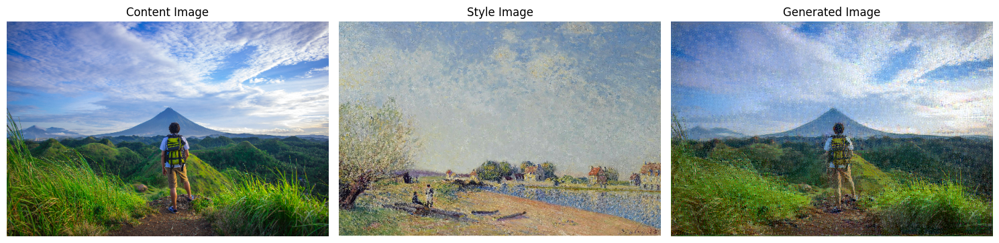

In [70]:
display_results(final_image[0])

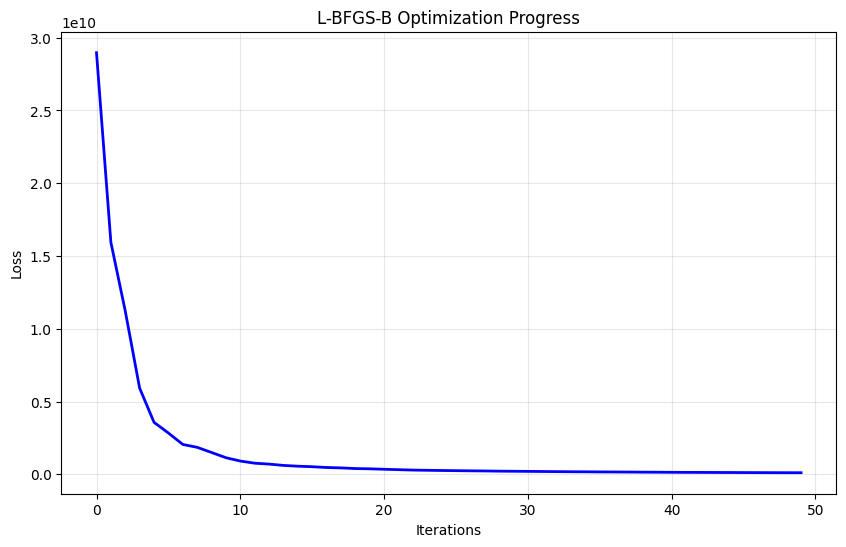

In [73]:
plt.figure(figsize=(10, 6))
plt.plot(range(len(loss_history)), loss_history, label='Total Loss', color='blue', linewidth=2)

plt.title('L-BFGS-B Optimization Progress')
plt.xlabel('Iterations')
plt.ylabel('Loss')
plt.grid(True, alpha=0.3)
plt.show()

___

     


# with Evaluator method

The underlying issue is that the L-BFGS-B optimizer in SciPy typically requests the objective function (loss) and the Jacobian (gradients) in separate function calls. In a standard implementation, this would trigger two independent forward and backward passes through the computational graph for the same input state $x$. Given that calculating gradients in TensorFlow inherently requires computing the loss first, the second pass is mathematically redundant and computationally expensive.

In [76]:
class Evaluator(object):
    def __init__(self):
        self.loss_value = None
        self.grads_values = None

    def loss(self, x):
        x_reshaped = x.reshape((1, img_nrows, img_ncols, 3))
        generated_image = tf.convert_to_tensor(x_reshaped, dtype=tf.float32)

        with tf.GradientTape() as tape:
            tape.watch(generated_image)
            generated_features = model(generated_image)
            
            # Content Loss
            generated_content = generated_features[content_layers[0]]
            content_loss = content_weight * compute_content_loss(
                generated_content, content_target
            )
            
            # Style Loss
            style_loss = 0
            for layer in style_layers:
                generated_style = generated_features[layer]
                style_loss += compute_style_loss(
                    generated_style, gram_style_targets[layer]
                )
            style_loss *= style_weight
            
            # TV Loss
            tv_loss = total_variation_weight * total_variation_loss(generated_image)
            total_loss = content_loss + style_loss + tv_loss

        grads = tape.gradient(total_loss, generated_image)
        
        # Cache the results
        self.loss_value = total_loss.numpy().astype('float64')
        self.grads_values = grads.numpy().flatten().astype('float64')
        
        return self.loss_value

    def grads(self, x):
        return self.grads_values

evaluator = Evaluator()

In [77]:
x = preprocess_image(content_image_path)
x_opt = x.flatten().astype('float64')

style_weight = 0.05  
content_weight = 1.0

# Run Loop
iterations = 20
loss_history = []
start_time = time.time()

print("Starting L-BFGS optimization...")

for i in range(iterations):
    # This runs the optimizer for 20 steps, then pauses to print
    x_opt, min_val, info = fmin_l_bfgs_b(
        evaluator.loss, 
        x_opt,
        fprime=evaluator.grads,
        maxfun=30, 
        disp=True
    )
    loss_history.append(min_val)
    print(f"Iteration {i+1}/{iterations} completed. Current Loss: {min_val:.2e}")

print(f"Total time: {time.time() - start_time:.2f}s")



Starting L-BFGS optimization...
Iteration 1/20 completed. Current Loss: 1.34e+07
Iteration 2/20 completed. Current Loss: 5.85e+06
Iteration 3/20 completed. Current Loss: 4.10e+06
Iteration 4/20 completed. Current Loss: 3.29e+06
Iteration 5/20 completed. Current Loss: 2.87e+06
Iteration 6/20 completed. Current Loss: 2.45e+06
Iteration 7/20 completed. Current Loss: 2.21e+06
Iteration 8/20 completed. Current Loss: 1.95e+06
Iteration 9/20 completed. Current Loss: 1.77e+06
Iteration 10/20 completed. Current Loss: 1.61e+06
Iteration 11/20 completed. Current Loss: 1.48e+06
Iteration 12/20 completed. Current Loss: 1.38e+06
Iteration 13/20 completed. Current Loss: 1.29e+06
Iteration 14/20 completed. Current Loss: 1.24e+06
Iteration 15/20 completed. Current Loss: 1.18e+06
Iteration 16/20 completed. Current Loss: 1.13e+06
Iteration 17/20 completed. Current Loss: 1.08e+06
Iteration 18/20 completed. Current Loss: 1.04e+06
Iteration 19/20 completed. Current Loss: 9.89e+05
Iteration 20/20 completed. 

In [78]:
final_image = x_opt.reshape((1, img_nrows, img_ncols, 3))

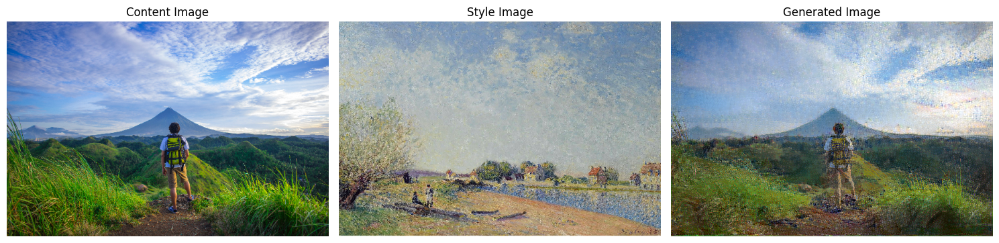

In [79]:
display_results(final_image[0])

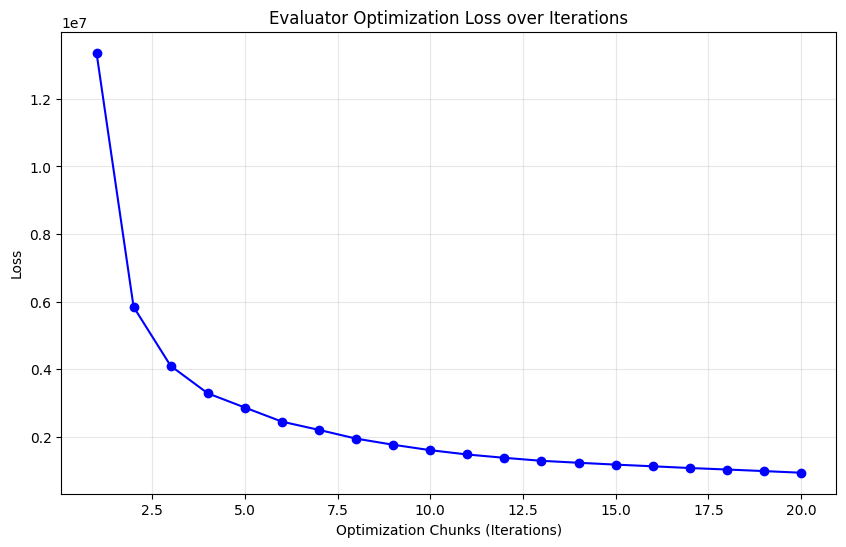

In [81]:
plt.figure(figsize=(10, 6))
steps = range(1, len(loss_history) + 1)

plt.plot(steps, loss_history, marker='o', linestyle='-', color='b', label='Loss')
plt.title('Evaluator Optimization Loss over Iterations')
plt.xlabel('Optimization Chunks (Iterations)')
plt.ylabel('Loss')
plt.grid(True, alpha=0.3)
plt.show()

# Run function

In [82]:
def run_nst(content_path, style_path, method='lbfgs', epochs=20, 
            content_w=1.0, style_w=0.05, tv_w=30,
            img_height=400):
    """
    Run Neural Style Transfer with one function call using existing helper functions
    """
    
    global base_image, style_reference_image, generated_image
    global model, content_layers, style_layers
    global content_target, gram_style_targets
    global img_nrows, img_ncols
    global content_weight, style_weight, total_variation_weight
    
    width, height = load_img(content_path).size
    img_nrows = img_height
    img_ncols = int(width * img_nrows / height)
    
    print(f"Image dimensions: original=({width}, {height}), resized=({img_ncols}, {img_nrows})")
    
    content_weight = content_w
    style_weight = style_w  
    total_variation_weight = tv_w
    
    print("Loading and preprocessing images...")
    base_image = preprocess_image(content_path)
    style_reference_image = preprocess_image(style_path)
    
    if hasattr(base_image, 'numpy'):
        generated_image = tf.Variable(base_image)
    else:
        generated_image = tf.Variable(tf.convert_to_tensor(base_image, dtype=tf.float32))
    
    print("Setting up feature extractor...")
    model, content_layers, style_layers = vgg19_feature_extractor()
    
    print("Precomputing content and style targets...")
    content_targets = model(base_image)
    style_targets = model(style_reference_image)
    
    content_target = content_targets[content_layers[0]]
    gram_style_targets = {
        layer: gram_matrix(style_targets[layer]) 
        for layer in style_layers
    }
    
    print(f"Starting {method.upper()} optimization for {epochs} epochs...")
    start_time = time.time()
    
        
    if method.lower() == 'lbfgs':
        iteration = [0]
        
        def callback(x):
            loss, _ = compute_loss_and_grads(x)
            if iteration[0] % max(1, epochs // 10) == 0:
                print(f'Iteration {iteration[0]}, Loss: {loss:.2e}')
            iteration[0] += 1
        
        if hasattr(base_image, 'numpy'):
            x = base_image.numpy().flatten().astype('float64')
        else:
            x = base_image.flatten().astype('float64')
        
        x_opt, loss_value, info = fmin_l_bfgs_b(
            compute_loss_and_grads, 
            x, 
            maxiter=epochs,
            maxfun=epochs + 10,
            disp=True,
            callback=callback
        )
        
        final_image = x_opt.reshape((1, img_nrows, img_ncols, 3))
        
    elif method.lower() == 'evaluator':
        evaluator = Evaluator()
        
        if hasattr(base_image, 'numpy'):
            x = base_image.numpy().flatten().astype('float64')
        else:
            x = base_image.flatten().astype('float64')
        
        print_interval = max(1, epochs // 10)
        
        for i in range(epochs):
            x, min_val, info = fmin_l_bfgs_b(
                evaluator.loss, 
                x,
                fprime=evaluator.grads,
                maxfun=20, 
                disp=False
            )
            
            if (i + 1) % print_interval == 0:
                print(f"Iteration {i+1}/{epochs} - Loss: {min_val:.2e}")
        
        final_image = x.reshape((1, img_nrows, img_ncols, 3))
        
    else:
        raise ValueError("Method must be 'lbfgs', or 'evaluator'")
    
    total_time = time.time() - start_time
    print(f" {method.upper()} optimization completed in {total_time:.2f} seconds!")
    
    print("Displaying results...")
    display_results(final_image)
    
    return final_image

Image dimensions: original=(840, 628), resized=(535, 400)
Loading and preprocessing images...
Setting up feature extractor...
Precomputing content and style targets...
Starting LBFGS optimization for 50 epochs...
Iteration 0, Loss: 1.29e+11
Iteration 5, Loss: 1.70e+10
Iteration 10, Loss: 5.49e+09
Iteration 15, Loss: 2.74e+09
Iteration 20, Loss: 1.91e+09
Iteration 25, Loss: 1.32e+09
Iteration 30, Loss: 1.09e+09
Iteration 35, Loss: 8.94e+08
Iteration 40, Loss: 7.52e+08
Iteration 45, Loss: 6.56e+08
 LBFGS optimization completed in 23.26 seconds!
Displaying results...


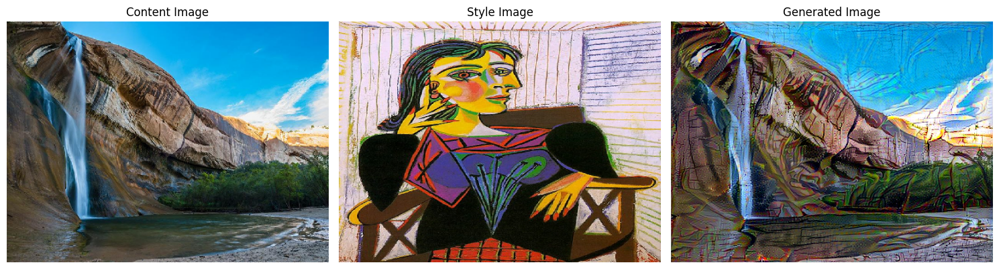

In [83]:
result2 = run_nst('/kaggle/input/image-classification/validation/validation/travel and adventure/13.jpg', 
                  '/kaggle/input/best-artworks-of-all-time/images/images/Pablo_Picasso/Pablo_Picasso_92.jpg', 
                  method='lbfgs', epochs=50,
                  content_w=1.0, style_w=0.5, tv_w=30)

Image dimensions: original=(840, 628), resized=(535, 400)
Loading and preprocessing images...
Setting up feature extractor...
Precomputing content and style targets...
Starting EVALUATOR optimization for 30 epochs...
Iteration 3/30 - Loss: 6.53e+07
Iteration 6/30 - Loss: 3.48e+07
Iteration 9/30 - Loss: 2.58e+07
Iteration 12/30 - Loss: 2.15e+07
Iteration 15/30 - Loss: 1.85e+07
Iteration 18/30 - Loss: 1.66e+07
Iteration 21/30 - Loss: 1.53e+07
Iteration 24/30 - Loss: 1.43e+07
Iteration 27/30 - Loss: 1.35e+07
Iteration 30/30 - Loss: 1.27e+07
 EVALUATOR optimization completed in 151.80 seconds!
Displaying results...


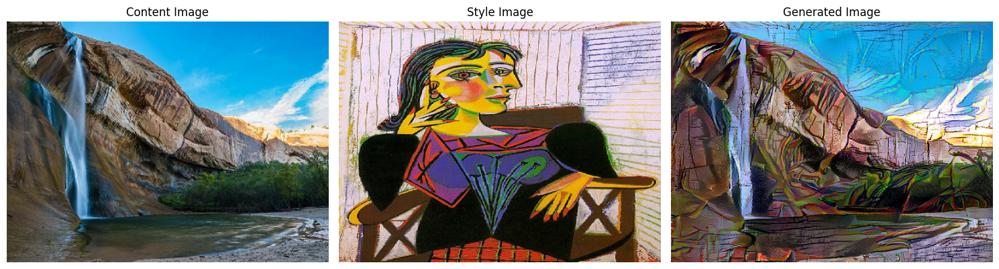

In [84]:
result3 = run_nst('/kaggle/input/image-classification/validation/validation/travel and adventure/13.jpg', 
                  '/kaggle/input/best-artworks-of-all-time/images/images/Pablo_Picasso/Pablo_Picasso_92.jpg', 
                  method='evaluator', epochs=30,
                  content_w=1.0, style_w=0.05, tv_w=30)

Image dimensions: original=(256, 256), resized=(400, 400)
Loading and preprocessing images...
Setting up feature extractor...
Precomputing content and style targets...
Starting LBFGS optimization for 50 epochs...
Iteration 0, Loss: 2.02e+10
Iteration 5, Loss: 3.49e+09
Iteration 10, Loss: 1.09e+09
Iteration 15, Loss: 6.27e+08
Iteration 20, Loss: 4.16e+08
Iteration 25, Loss: 2.93e+08
Iteration 30, Loss: 2.27e+08
Iteration 35, Loss: 1.75e+08
Iteration 40, Loss: 1.45e+08
Iteration 45, Loss: 1.24e+08
 LBFGS optimization completed in 19.96 seconds!
Displaying results...


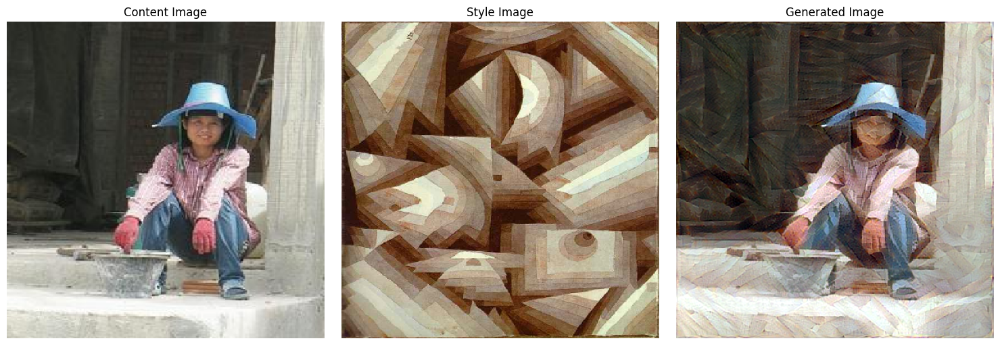

In [85]:
result2 = run_nst('/kaggle/input/image-classification/images/images/travel and  adventure/Places365_val_00005982.jpg', 
                  '/kaggle/input/best-artworks-of-all-time/images/images/Paul_Klee/Paul_Klee_24.jpg', 
                  method='lbfgs', epochs=50,
                  content_w=1.0, style_w=0.5, tv_w=30)

Image dimensions: original=(960, 1280), resized=(300, 400)
Loading and preprocessing images...
Setting up feature extractor...
Precomputing content and style targets...
Starting LBFGS optimization for 50 epochs...
Iteration 0, Loss: 6.06e+10
Iteration 5, Loss: 1.21e+10
Iteration 10, Loss: 4.76e+09
Iteration 15, Loss: 2.88e+09
Iteration 20, Loss: 1.85e+09
Iteration 25, Loss: 1.45e+09
Iteration 30, Loss: 1.19e+09
Iteration 35, Loss: 9.80e+08
Iteration 40, Loss: 8.32e+08
Iteration 45, Loss: 7.42e+08
 LBFGS optimization completed in 17.08 seconds!
Displaying results...


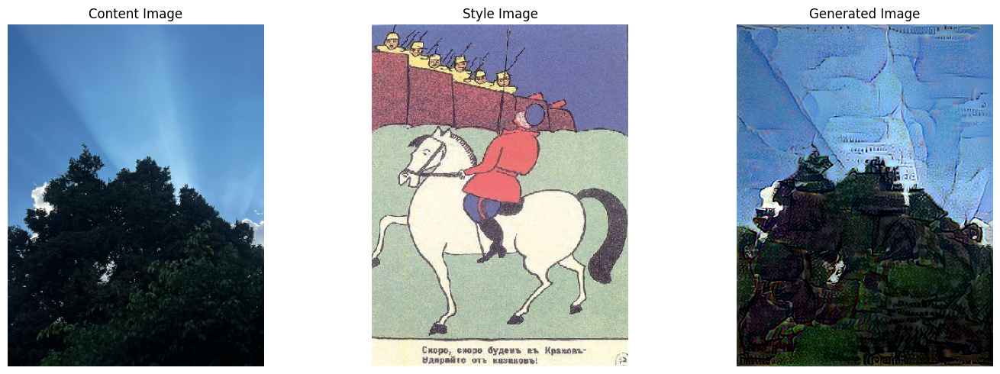

In [86]:
result2 = run_nst('/kaggle/input/test-nst/WhatsApp Image 2025-11-29 at 9.14.46 PM.jpeg', 
                  '/kaggle/input/best-artworks-of-all-time/images/images/Kazimir_Malevich/Kazimir_Malevich_1.jpg', 
                  method='lbfgs', epochs=50,
                  content_w=1.0, style_w=0.5, tv_w=30)

Image dimensions: original=(1280, 960), resized=(533, 400)
Loading and preprocessing images...
Setting up feature extractor...
Precomputing content and style targets...
Starting LBFGS optimization for 50 epochs...
Iteration 0, Loss: 2.98e+10
Iteration 5, Loss: 3.00e+09
Iteration 10, Loss: 9.46e+08
Iteration 15, Loss: 5.23e+08
Iteration 20, Loss: 3.15e+08
Iteration 25, Loss: 2.33e+08
Iteration 30, Loss: 1.84e+08
Iteration 35, Loss: 1.54e+08
Iteration 40, Loss: 1.30e+08
Iteration 45, Loss: 1.11e+08
 LBFGS optimization completed in 23.13 seconds!
Displaying results...


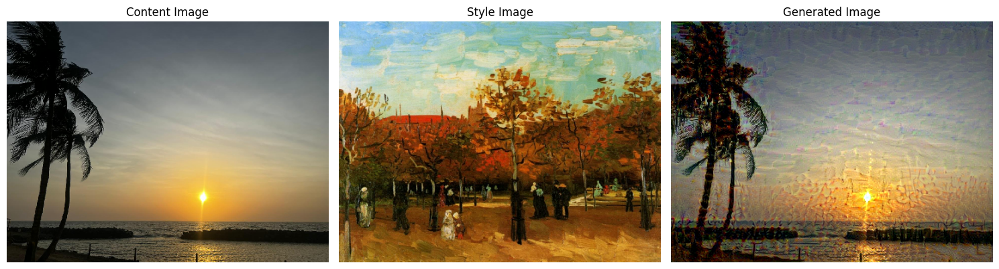

In [87]:
result2 = run_nst('/kaggle/input/nst-test/WhatsApp Image 2025-11-29 at 9.24.44 PM.jpeg', 
                  '/kaggle/input/best-artworks-of-all-time/images/images/Vincent_van_Gogh/Vincent_van_Gogh_116.jpg', 
                  method='lbfgs', epochs=50,
                  content_w=1.0, style_w=0.5, tv_w=30)

Image dimensions: original=(1280, 960), resized=(533, 400)
Loading and preprocessing images...
Setting up feature extractor...
Precomputing content and style targets...
Starting LBFGS optimization for 50 epochs...
Iteration 0, Loss: 1.57e+10
Iteration 5, Loss: 2.32e+09
Iteration 10, Loss: 8.36e+08
Iteration 15, Loss: 4.22e+08
Iteration 20, Loss: 2.58e+08
Iteration 25, Loss: 1.83e+08
Iteration 30, Loss: 1.27e+08
Iteration 35, Loss: 1.01e+08
Iteration 40, Loss: 8.03e+07
Iteration 45, Loss: 6.54e+07
 LBFGS optimization completed in 22.13 seconds!
Displaying results...


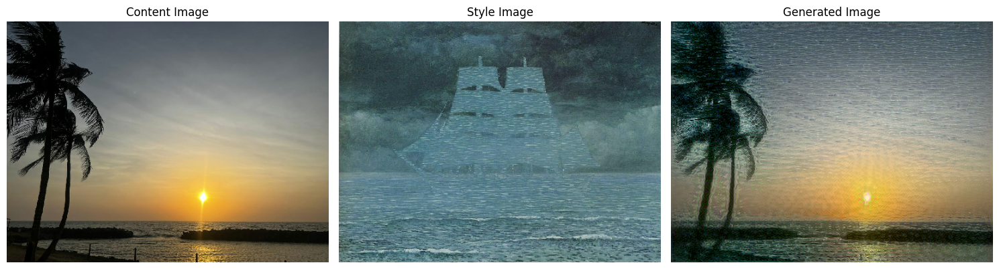

In [88]:
result2 = run_nst('/kaggle/input/nst-test/WhatsApp Image 2025-11-29 at 9.24.44 PM.jpeg', 
                  '/kaggle/input/best-artworks-of-all-time/images/images/Rene_Magritte/Rene_Magritte_109.jpg', 
                  method='lbfgs', epochs=50,
                  content_w=1.0, style_w=0.75, tv_w=30)

The Evaluator is computationally 'lighter' per step, which is great for memory, but it requires many more iterations to converge. L-BFGS has a 'heavier' computational cost per step, but because it finds a more direct path to the solution, the total time to finish is much faster.